In [54]:
# dataset http://cgwb.gov.in/cgwbpnm/public/uploads/documents/1686055122486176238file.pdf
#home page of dataset : http://cgwb.gov.in/ground-water-quality

#pip install -r requirements.txt
import warnings
warnings.filterwarnings('ignore')

In [55]:
import pandas as pd
import numpy as np
from sklearn import preprocessing
from sklearn.decomposition import PCA
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import silhouette_score

import folium
import pandas as pd
import geopandas 

from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from tqdm import tqdm

from sklearn.cluster import KMeans

In [56]:
import seaborn as sn

from sklearn.mixture import GaussianMixture

In [57]:
df_raw= pd.read_csv('data/welldataset.csv')
df_raw

,Well ID,S.No,STATE,DISTRICT,BLOCK,LOCATION,LATITUDE,LONGITUDE,Year,pH,...,PO4,TH,Ca,Mg,Na,K,F,SiO2,TDS,U(ppb)
0,W113126092431802,1.0,A&N Islands,South Andaman,PORT BLAIR,Kodiaghat,11.545,92.74583,2021.0,7.74,...,NaN,175,34.0,22.00,10.00,0.00,0.840,NaN,206.0,4.8
1,W113616092411001,2.0,A&N Islands,South Andaman,PORT BLAIR,Sippighat,11.6025,92.73,2021.0,7.53,...,NaN,250,52.0,29.00,51.00,1.00,0.280,NaN,381.0,6.4
2,W113640092443301,3.0,A&N Islands,South Andaman,PORT BLAIR,Brichganj,11.62083,92.73028,2021.0,7.50,...,NaN,125,4.0,28.00,10.00,1.00,0.460,NaN,151.0,0.0
3,W114421092422801,4.0,A&N Islands,South Andaman,FERRARGUNJ,Wimberleyganj,11.7325,92.70861,2021.0,7.60,...,NaN,135,26.0,17.00,15.00,2.00,0.370,NaN,198.0,0.4
4,W113955092391801,5.0,A&N Islands,South Andaman,FERRARGUNJ,Ograbraj,11.66361,92.65806,2021.0,7.82,...,NaN,465,56.0,79.00,336.00,18.00,0.950,NaN,1424.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9113,NaN,7131.0,Odisha,SUNDERGARH,SUNDARGARH,Bargad,NaN,NaN,2021.0,7.06,...,NaN,49,10.0,5.80,13.14,2.58,0.153,NaN,NaN,NaN
9114,NaN,7132.0,Odisha,SUNDERGARH,TANGARAPALI,Mahulapali 1,NaN,NaN,2021.0,7.99,...,NaN,162,35.2,17.76,91.83,15.47,0.588,NaN,NaN,NaN
9115,NaN,7133.0,Odisha,SUNDERGARH,BALISANKARA,Talsara,NaN,NaN,2021.0,7.84,...,NaN,44,10.0,4.56,21.20,0.75,0.678,NaN,NaN,NaN
9116,NaN,8752.0,Uttrakhand,Nainital,Ramnagar,Dhela,NaN,NaN,2021.0,7.61,...,NaN,330,68.0,39.00,12.00,1.80,0.000,22.0,NaN,NaN


In [58]:
df_raw.dropna(subset=['LATITUDE','LONGITUDE'], inplace=True)


df_raw = df_raw.reset_index(drop=True)
df_raw

,Well ID,S.No,STATE,DISTRICT,BLOCK,LOCATION,LATITUDE,LONGITUDE,Year,pH,...,PO4,TH,Ca,Mg,Na,K,F,SiO2,TDS,U(ppb)
0,W113126092431802,1.0,A&N Islands,South Andaman,PORT BLAIR,Kodiaghat,11.545,92.74583,2021.0,7.74,...,NaN,175,34.0,22.0,10.0,0.00,0.84,NaN,206.0,4.8
1,W113616092411001,2.0,A&N Islands,South Andaman,PORT BLAIR,Sippighat,11.6025,92.73,2021.0,7.53,...,NaN,250,52.0,29.0,51.0,1.00,0.28,NaN,381.0,6.4
2,W113640092443301,3.0,A&N Islands,South Andaman,PORT BLAIR,Brichganj,11.62083,92.73028,2021.0,7.50,...,NaN,125,4.0,28.0,10.0,1.00,0.46,NaN,151.0,0.0
3,W114421092422801,4.0,A&N Islands,South Andaman,FERRARGUNJ,Wimberleyganj,11.7325,92.70861,2021.0,7.60,...,NaN,135,26.0,17.0,15.0,2.00,0.37,NaN,198.0,0.4
4,W113955092391801,5.0,A&N Islands,South Andaman,FERRARGUNJ,Ograbraj,11.66361,92.65806,2021.0,7.82,...,NaN,465,56.0,79.0,336.0,18.00,0.95,NaN,1424.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8245,NaN,7092.0,Odisha,GANJAM,DHARAKOTE,Gangapur 1,19.4313477,84.9891799,2021.0,8.14,...,NaN,339,80.0,34.0,47.0,1.49,0.12,NaN,NaN,NaN
8246,NaN,7100.0,Odisha,Jajpur,RASUL PUR,Kuakhia 1,20.8199072,86.2013912,2021.0,7.88,...,NaN,294,71.0,28.0,79.5,10.20,0.17,NaN,NaN,NaN
8247,NaN,7101.0,Odisha,Jajpur,DHARMASALA,Sarei,20.7291111,86.1358003,2021.0,7.70,...,NaN,34,10.0,2.0,10.9,19.70,0.17,NaN,NaN,NaN
8248,NaN,7102.0,Odisha,JHARSUGUDA,JHARSUGUDA,Jharsuguda 2,21.8653634,84.0239656,2021.0,7.76,...,NaN,70,22.0,4.0,14.0,2.00,0.32,NaN,NaN,NaN


In [59]:
df_raw.columns

Index(['Well ID', 'S.No', 'STATE', 'DISTRICT', 'BLOCK', 'LOCATION', 'LATITUDE',
       'LONGITUDE', 'Year', 'pH', 'EC', 'CO3', 'HCO3', 'Cl', 'SO4', 'NO3',
       'PO4', 'TH', 'Ca', 'Mg', 'Na', 'K', 'F', 'SiO2', 'TDS', 'U(ppb)'],
      dtype='object')

In [60]:
#testing 
#df_raw.loc[120:160:]

In [61]:
df = df_raw[[
         'pH', 'EC', 'CO3', 'HCO3', 'Cl', 'SO4', 'NO3',
       'PO4', 'TH', 'Ca', 'Mg', 'Na', 'K', 'F', 'SiO2', 'TDS', 'U(ppb)', 'LATITUDE',
       'LONGITUDE', 'LOCATION' , 'DISTRICT' , 'STATE'
        
        ]]
features = [ 'pH', 'EC', 'CO3', 'HCO3', 'Cl', 'SO4', 'NO3',
        'TH', 'Ca', 'Mg', 'Na', 'K', 'F', 'SiO2', 'TDS', 'U(ppb)']
df

,pH,EC,CO3,HCO3,Cl,SO4,NO3,PO4,TH,Ca,...,K,F,SiO2,TDS,U(ppb),LATITUDE,LONGITUDE,LOCATION,DISTRICT,STATE
0,7.74,349.0,0.0,183.0,25.0,1.0,1.0,NaN,175,34.0,...,0.00,0.84,NaN,206.0,4.8,11.545,92.74583,Kodiaghat,South Andaman,A&N Islands
1,7.53,660.0,0.0,262.0,82.0,5.0,1.0,NaN,250,52.0,...,1.00,0.28,NaN,381.0,6.4,11.6025,92.73,Sippighat,South Andaman,A&N Islands
2,7.50,270.0,0.0,116.0,35.0,1.0,0.0,NaN,125,4.0,...,1.00,0.46,NaN,151.0,0.0,11.62083,92.73028,Brichganj,South Andaman,A&N Islands
3,7.60,311.0,0.0,159.0,39.0,2.0,0.0,NaN,135,26.0,...,2.00,0.37,NaN,198.0,0.4,11.7325,92.70861,Wimberleyganj,South Andaman,A&N Islands
4,7.82,2501.0,0.0,512.0,560.0,56.0,5.0,NaN,465,56.0,...,18.00,0.95,NaN,1424.0,0.0,11.66361,92.65806,Ograbraj,South Andaman,A&N Islands
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8245,8.14,890.0,0.0,385.0,88.0,13.0,8.0,NaN,339,80.0,...,1.49,0.12,NaN,NaN,NaN,19.4313477,84.9891799,Gangapur 1,GANJAM,Odisha
8246,7.88,960.0,0.0,217.0,121.0,80.0,43.7,NaN,294,71.0,...,10.20,0.17,NaN,NaN,NaN,20.8199072,86.2013912,Kuakhia 1,Jajpur,Odisha
8247,7.70,170.0,0.0,42.0,14.0,21.0,7.4,NaN,34,10.0,...,19.70,0.17,NaN,NaN,NaN,20.7291111,86.1358003,Sarei,Jajpur,Odisha
8248,7.76,210.0,0.0,98.0,12.0,6.0,1.0,NaN,70,22.0,...,2.00,0.32,NaN,NaN,NaN,21.8653634,84.0239656,Jharsuguda 2,JHARSUGUDA,Odisha


In [62]:
df.iloc[0]

pH                    7.74
EC                   349.0
CO3                    0.0
HCO3                 183.0
Cl                    25.0
SO4                    1.0
NO3                    1.0
PO4                    NaN
TH                     175
Ca                    34.0
Mg                    22.0
Na                    10.0
K                      0.0
F                     0.84
SiO2                   NaN
TDS                  206.0
U(ppb)                 4.8
LATITUDE            11.545
LONGITUDE         92.74583
LOCATION         Kodiaghat
DISTRICT     South Andaman
STATE          A&N Islands
Name: 0, dtype: object

In [63]:

#df['LOCATION'].fillna(0)
#df['LOCATION'].fillna(0)

#print(df[df['LOCATION'].isnull()])


# Handling Missing Values

In [64]:
#dtest = df.dropna(axis=0)
#dtest = df.fillna(0)
#dtest

#df['TH'].fillna(method='pad', inplace = True)


In [65]:
#df = df.fillna(-47)
df.isna().sum()


pH              4
EC              0
CO3            84
HCO3            0
Cl              0
SO4             2
NO3             2
PO4          2523
TH            682
Ca              1
Mg              0
Na              0
K              15
F             114
SiO2         3464
TDS          3984
U(ppb)       5281
LATITUDE        0
LONGITUDE       0
LOCATION       10
DISTRICT        0
STATE           0
dtype: int64

In [66]:
#dtest.isna('')
df[df.isnull().any(axis=1)]

,pH,EC,CO3,HCO3,Cl,SO4,NO3,PO4,TH,Ca,...,K,F,SiO2,TDS,U(ppb),LATITUDE,LONGITUDE,LOCATION,DISTRICT,STATE
0,7.74,349.0,0.0,183.0,25.0,1.0,1.0,NaN,175,34.0,...,0.00,0.84,NaN,206.0,4.8,11.545,92.74583,Kodiaghat,South Andaman,A&N Islands
1,7.53,660.0,0.0,262.0,82.0,5.0,1.0,NaN,250,52.0,...,1.00,0.28,NaN,381.0,6.4,11.6025,92.73,Sippighat,South Andaman,A&N Islands
2,7.50,270.0,0.0,116.0,35.0,1.0,0.0,NaN,125,4.0,...,1.00,0.46,NaN,151.0,0.0,11.62083,92.73028,Brichganj,South Andaman,A&N Islands
3,7.60,311.0,0.0,159.0,39.0,2.0,0.0,NaN,135,26.0,...,2.00,0.37,NaN,198.0,0.4,11.7325,92.70861,Wimberleyganj,South Andaman,A&N Islands
4,7.82,2501.0,0.0,512.0,560.0,56.0,5.0,NaN,465,56.0,...,18.00,0.95,NaN,1424.0,0.0,11.66361,92.65806,Ograbraj,South Andaman,A&N Islands
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8245,8.14,890.0,0.0,385.0,88.0,13.0,8.0,NaN,339,80.0,...,1.49,0.12,NaN,NaN,NaN,19.4313477,84.9891799,Gangapur 1,GANJAM,Odisha
8246,7.88,960.0,0.0,217.0,121.0,80.0,43.7,NaN,294,71.0,...,10.20,0.17,NaN,NaN,NaN,20.8199072,86.2013912,Kuakhia 1,Jajpur,Odisha
8247,7.70,170.0,0.0,42.0,14.0,21.0,7.4,NaN,34,10.0,...,19.70,0.17,NaN,NaN,NaN,20.7291111,86.1358003,Sarei,Jajpur,Odisha
8248,7.76,210.0,0.0,98.0,12.0,6.0,1.0,NaN,70,22.0,...,2.00,0.32,NaN,NaN,NaN,21.8653634,84.0239656,Jharsuguda 2,JHARSUGUDA,Odisha


In [67]:
#df = df.replace(r'^\s*$', np.nan, regex=True)
df.replace(to_replace='N.A.', value=np.nan , inplace=True)
df.replace(to_replace='nil', value=np.nan , inplace=True)
#df.replace(r'^\s*$', np.nan, regex=True, inplace=True)

#other=(df.fillna(method='ffill') + df.fillna(method='bfill'))/2)
#dtest = df.fillna(df.mean())


In [68]:
#df.fillna(method='ffill' , inplace=True)
df.interpolate(method='linear', inplace=True)
df.fillna(0,inplace=True)


In [69]:
df[features] = df[features].astype('float64')

In [70]:
#df['CO3'].idxmax()
#df.nlargest(35, ['PO4']) 

In [71]:
#remove noise
df = df[df['pH'] <= 14]

## your code here
df = df[df['EC'] <= 37230]
df = df[df['CO3'] <= 400]
df = df[df['HCO3'] <= 1000]
df = df[df['F'] <= 10]
df = df[df['Cl'] <= 250]
df = df[df['SO4'] <= 200]
df = df[df['NO3'] <= 45]
#df = df[df['PO4'] <= 0.025]
df = df[df['TH'] <=600 ]
df = df[df['Ca'] <= 200]
df = df[df['Mg'] <=180 ]
df = df[df['Na'] <= 250]
df = df[df['K'] <= 28]
df = df[df['SiO2'] <= 100]
df = df[df['TDS'] <= 1200]
df = df[df['U(ppb)'] <=1000 ]

## your code ends here :)
df.reset_index(inplace=True)
dtest = df
#df.to_csv('file1.csv')

In [72]:
df

,index,pH,EC,CO3,HCO3,Cl,SO4,NO3,PO4,TH,...,K,F,SiO2,TDS,U(ppb),LATITUDE,LONGITUDE,LOCATION,DISTRICT,STATE
0,0,7.74,349.0,0.0,183.0,25.0,1.0,1.0,0,175.0,...,0.00,0.840,0.0,206.0,4.80,11.545,92.74583,Kodiaghat,South Andaman,A&N Islands
1,1,7.53,660.0,0.0,262.0,82.0,5.0,1.0,0,250.0,...,1.00,0.280,0.0,381.0,6.40,11.6025,92.73,Sippighat,South Andaman,A&N Islands
2,2,7.50,270.0,0.0,116.0,35.0,1.0,0.0,0,125.0,...,1.00,0.460,0.0,151.0,0.00,11.62083,92.73028,Brichganj,South Andaman,A&N Islands
3,3,7.60,311.0,0.0,159.0,39.0,2.0,0.0,0,135.0,...,2.00,0.370,0.0,198.0,0.40,11.7325,92.70861,Wimberleyganj,South Andaman,A&N Islands
4,5,7.71,264.0,0.0,153.0,35.0,1.0,1.0,0,130.0,...,0.00,0.570,0.0,188.0,3.40,11.55778,92.72917,Burmanala,South Andaman,A&N Islands
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4613,8244,7.96,980.0,0.0,265.0,152.0,5.0,37.9,0,306.0,...,4.06,0.235,23.0,457.0,0.09,19.6060868,84.6724523,Aska 1,GANJAM,Odisha
4614,8245,8.14,890.0,0.0,385.0,88.0,13.0,8.0,0,339.0,...,1.49,0.120,23.0,457.0,0.09,19.4313477,84.9891799,Gangapur 1,GANJAM,Odisha
4615,8246,7.88,960.0,0.0,217.0,121.0,80.0,43.7,0,294.0,...,10.20,0.170,23.0,457.0,0.09,20.8199072,86.2013912,Kuakhia 1,Jajpur,Odisha
4616,8247,7.70,170.0,0.0,42.0,14.0,21.0,7.4,0,34.0,...,19.70,0.170,23.0,457.0,0.09,20.7291111,86.1358003,Sarei,Jajpur,Odisha


## copying df to get original data for cluster


In [73]:
df_original =df
df_original['indexing'] = df_original.index.values

In [74]:
dtest.isna().sum()


index        0
pH           0
EC           0
CO3          0
HCO3         0
Cl           0
SO4          0
NO3          0
PO4          0
TH           0
Ca           0
Mg           0
Na           0
K            0
F            0
SiO2         0
TDS          0
U(ppb)       0
LATITUDE     0
LONGITUDE    0
LOCATION     0
DISTRICT     0
STATE        0
indexing     0
dtype: int64

In [75]:
#df.fillna()


In [76]:
#dtest.to_csv('final.csv')

In [77]:
X = dtest.loc[:, features]
X


,pH,EC,CO3,HCO3,Cl,SO4,NO3,TH,Ca,Mg,Na,K,F,SiO2,TDS,U(ppb)
0,7.74,349.0,0.0,183.0,25.0,1.0,1.0,175.0,34.0,22.0,10.0,0.00,0.840,0.0,206.0,4.80
1,7.53,660.0,0.0,262.0,82.0,5.0,1.0,250.0,52.0,29.0,51.0,1.00,0.280,0.0,381.0,6.40
2,7.50,270.0,0.0,116.0,35.0,1.0,0.0,125.0,4.0,28.0,10.0,1.00,0.460,0.0,151.0,0.00
3,7.60,311.0,0.0,159.0,39.0,2.0,0.0,135.0,26.0,17.0,15.0,2.00,0.370,0.0,198.0,0.40
4,7.71,264.0,0.0,153.0,35.0,1.0,1.0,130.0,26.0,16.0,15.0,0.00,0.570,0.0,188.0,3.40
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4613,7.96,980.0,0.0,265.0,152.0,5.0,37.9,306.0,68.0,33.0,80.0,4.06,0.235,23.0,457.0,0.09
4614,8.14,890.0,0.0,385.0,88.0,13.0,8.0,339.0,80.0,34.0,47.0,1.49,0.120,23.0,457.0,0.09
4615,7.88,960.0,0.0,217.0,121.0,80.0,43.7,294.0,71.0,28.0,79.5,10.20,0.170,23.0,457.0,0.09
4616,7.70,170.0,0.0,42.0,14.0,21.0,7.4,34.0,10.0,2.0,10.9,19.70,0.170,23.0,457.0,0.09


In [78]:
dtest[features] = dtest[features].astype('float64')


In [79]:
dtest[features].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4618 entries, 0 to 4617
Data columns (total 16 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   pH      4618 non-null   float64
 1   EC      4618 non-null   float64
 2   CO3     4618 non-null   float64
 3   HCO3    4618 non-null   float64
 4   Cl      4618 non-null   float64
 5   SO4     4618 non-null   float64
 6   NO3     4618 non-null   float64
 7   TH      4618 non-null   float64
 8   Ca      4618 non-null   float64
 9   Mg      4618 non-null   float64
 10  Na      4618 non-null   float64
 11  K       4618 non-null   float64
 12  F       4618 non-null   float64
 13  SiO2    4618 non-null   float64
 14  TDS     4618 non-null   float64
 15  U(ppb)  4618 non-null   float64
dtypes: float64(16)
memory usage: 577.4 KB


## Data Distribution

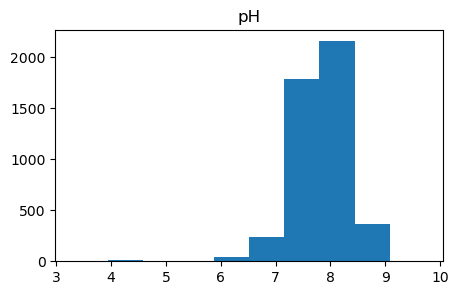

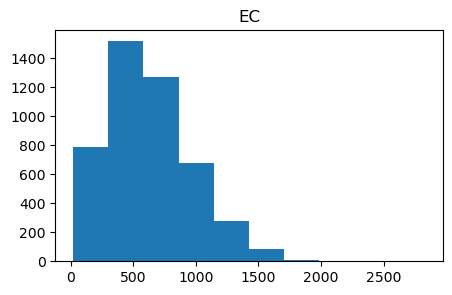

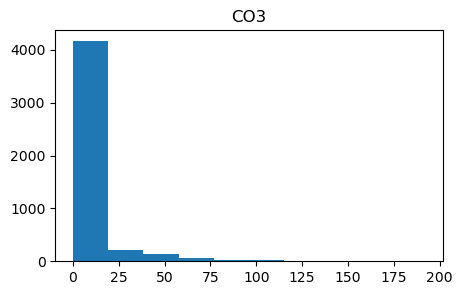

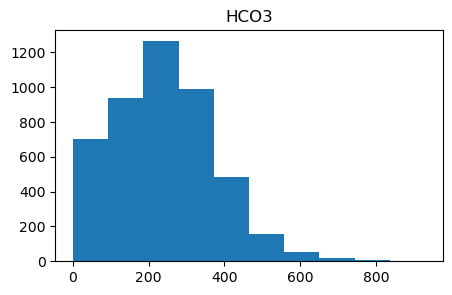

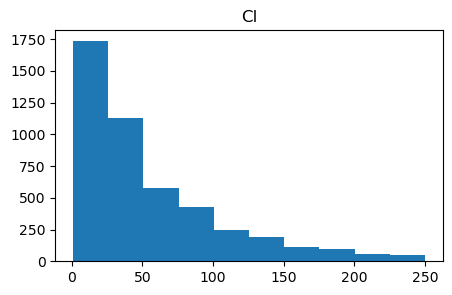

...

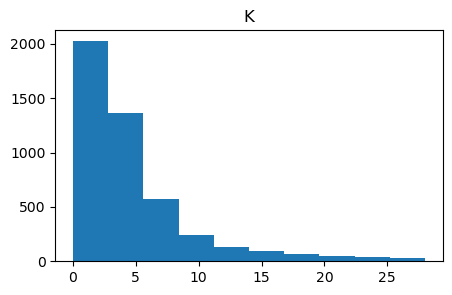

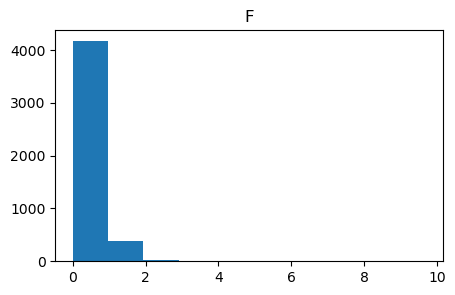

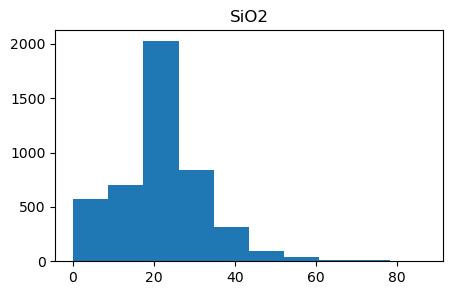

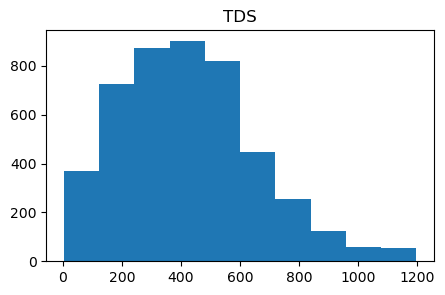

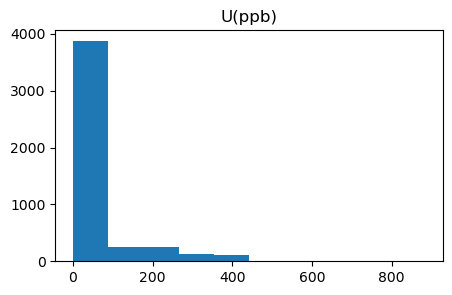

In [80]:
#dc3plot = dc3plot.astype('float64')

for col in features:
    #print(dc1plot[col])
    min_val = dtest[col].min()
    max_val = dtest[col].max()
    plt.figure(figsize =(5,3))
    plt.title(col)
    #sn.histplot(data=dtest[col])
    plt.hist(dtest[col], bins=10, range=(min_val, max_val))
    name = "images/data/"+str(col)+".png"
    plt.savefig(name)
    plt.show()
 


In [81]:
dtest['pH'].min()

3.3

In [82]:
temp = dtest

In [83]:
temp['pH'].max()

9.73

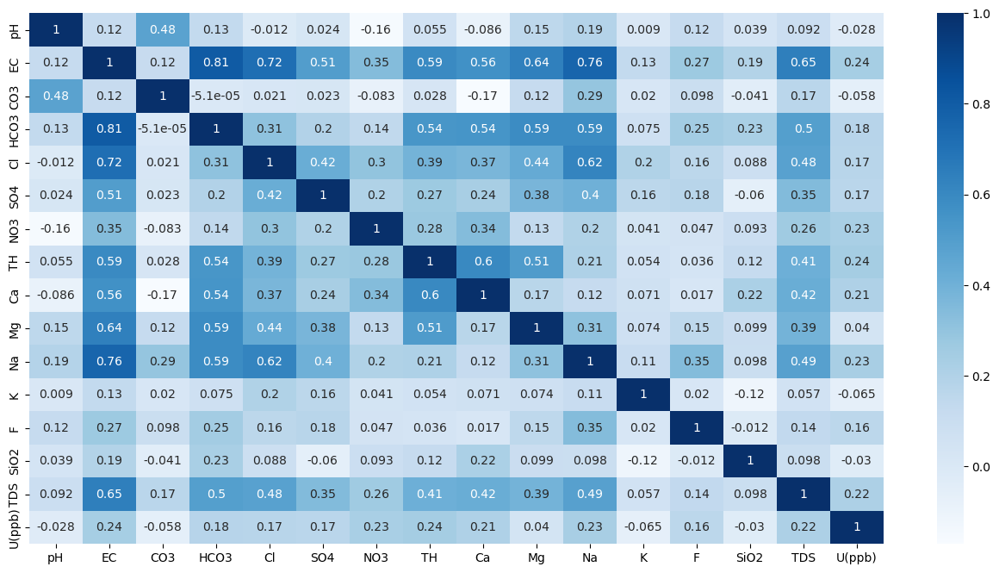

In [84]:
corrrelation_matrix =  dtest.loc[:, features].corr()
corrrelation_matrix
plt.figure(figsize = (16,8))

sn.heatmap(corrrelation_matrix, annot=True,cmap="Blues")
name = "images/heatmap.png"
plt.savefig(name)
plt.show()

In [85]:
X.describe().T

,count,mean,std,min,25%,50%,75%,max
pH,4618.0,7.825968,0.507767,3.300000,7.570000,7.850000,8.120000,9.730000
EC,4618.0,625.342100,339.194089,17.740000,384.000000,582.000000,833.750000,2832.000000
CO3,4618.0,5.065064,15.220521,0.000000,0.000000,0.000000,0.000000,192.000000
HCO3,4618.0,240.409472,132.764504,0.000000,146.000000,232.000000,317.000000,930.000000
Cl,4618.0,55.357629,50.530384,0.780000,20.000000,35.000000,77.917500,250.000000
SO4,4618.0,25.607034,29.319665,0.000000,6.500000,16.000000,33.675000,191.000000
NO3,4618.0,11.995811,12.552697,0.000000,1.000000,7.400000,20.000000,45.000000
TH,4618.0,173.122425,125.429412,0.000000,65.230000,175.000000,260.000000,600.000000
Ca,4618.0,42.917434,26.968930,1.000000,22.000000,38.030000,58.000000,192.000000
Mg,4618.0,24.202211,16.913518,0.000000,12.000000,22.000000,34.000000,107.000000


In [86]:

X = dtest.loc[:, features].values

#X_scaled = StandardScaler().fit_transform(X)

X_scaled = MinMaxScaler().fit_transform(X)

X_scaled

array([[6.90513219e-01, 1.17707674e-01, 0.00000000e+00, ...,
        0.00000000e+00, 1.69529248e-01, 5.42986425e-03],
       [6.57853810e-01, 2.28216298e-01, 0.00000000e+00, ...,
        0.00000000e+00, 3.16252338e-01, 7.23981900e-03],
       [6.53188180e-01, 8.96363520e-02, 0.00000000e+00, ...,
        0.00000000e+00, 1.23416277e-01, 0.00000000e+00],
       ...,
       [7.12286159e-01, 3.34816257e-01, 0.00000000e+00, ...,
        2.64367816e-01, 3.79972080e-01, 1.01809955e-04],
       [6.84292379e-01, 5.41030324e-02, 0.00000000e+00, ...,
        2.64367816e-01, 3.79972080e-01, 1.01809955e-04],
       [6.93623639e-01, 6.83163603e-02, 0.00000000e+00, ...,
        2.64367816e-01, 3.79972080e-01, 1.01809955e-04]])

## Kmeans without Pca

In [87]:
# data frame without pca

#dwp = dtest
#dwp = pd.DataFrame(dtest, columns=features) 
#dwp = dtest.copy()
dwp = pd.DataFrame(X_scaled, columns=features) 

#dwp = dtest.loc[:, features]
#dwp = dwp.loc[:, features]
dwp

,pH,EC,CO3,HCO3,Cl,SO4,NO3,TH,Ca,Mg,Na,K,F,SiO2,TDS,U(ppb)
0,0.690513,0.117708,0.0,0.196774,0.097183,0.005236,0.022222,0.291667,0.172775,0.205607,0.0400,0.000000,0.086809,0.000000,0.169529,0.005430
1,0.657854,0.228216,0.0,0.281720,0.325897,0.026178,0.022222,0.416667,0.267016,0.271028,0.2040,0.035714,0.028936,0.000000,0.316252,0.007240
2,0.653188,0.089636,0.0,0.124731,0.137308,0.005236,0.000000,0.208333,0.015707,0.261682,0.0400,0.035714,0.047538,0.000000,0.123416,0.000000
3,0.668740,0.104205,0.0,0.170968,0.153358,0.010471,0.000000,0.225000,0.130890,0.158879,0.0600,0.071429,0.038237,0.000000,0.162822,0.000452
4,0.685848,0.087504,0.0,0.164516,0.137308,0.005236,0.022222,0.216667,0.130890,0.149533,0.0600,0.000000,0.058906,0.000000,0.154438,0.003846
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4613,0.724728,0.341923,0.0,0.284946,0.606773,0.026178,0.842222,0.510000,0.350785,0.308411,0.3200,0.145000,0.024286,0.264368,0.379972,0.000102
4614,0.752722,0.309943,0.0,0.413978,0.349972,0.068063,0.177778,0.565000,0.413613,0.317757,0.1880,0.053214,0.012401,0.264368,0.379972,0.000102
4615,0.712286,0.334816,0.0,0.233333,0.482385,0.418848,0.971111,0.490000,0.366492,0.261682,0.3180,0.364286,0.017568,0.264368,0.379972,0.000102
4616,0.684292,0.054103,0.0,0.045161,0.053046,0.109948,0.164444,0.056667,0.047120,0.018692,0.0436,0.703571,0.017568,0.264368,0.379972,0.000102


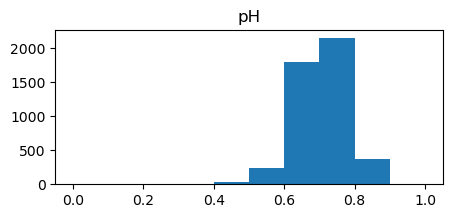

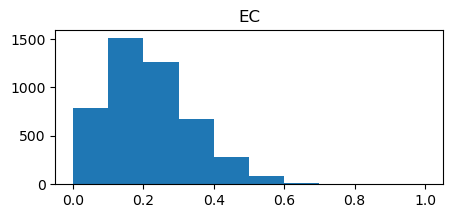

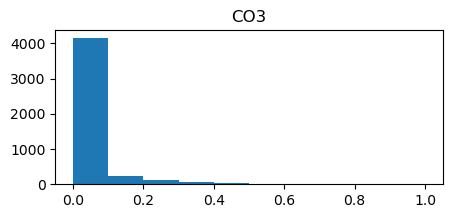

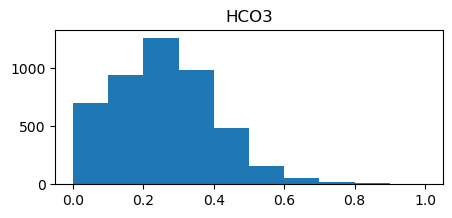

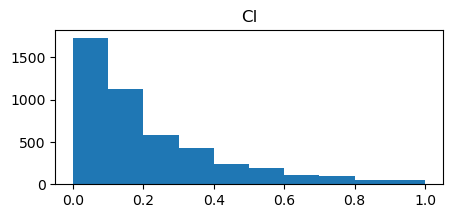

...

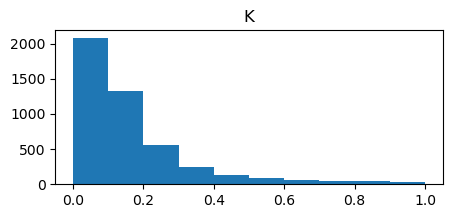

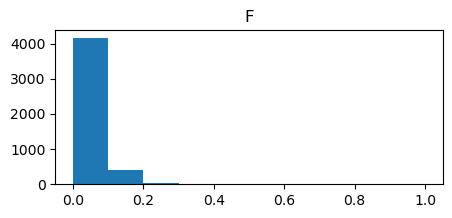

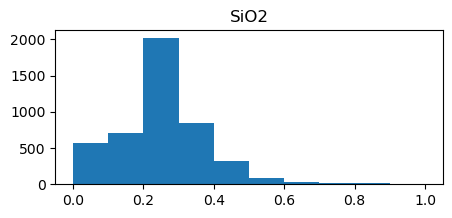

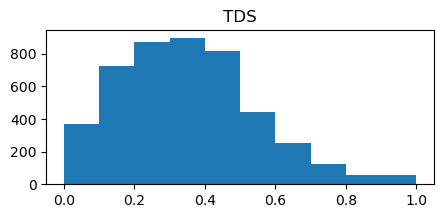

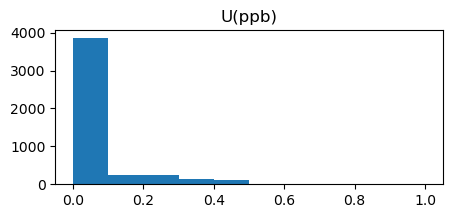

In [88]:
# Distribution.
for col in features:
    #print(dc1plot[col])
    min_val = dwp[col].min()
    max_val = dwp[col].max()
    plt.figure(figsize =(5,2))
    plt.title(col)
    #sn.histplot(data=dtest[col])
    plt.hist(dwp[col], bins=10, range=(min_val, max_val))
    plt.show()

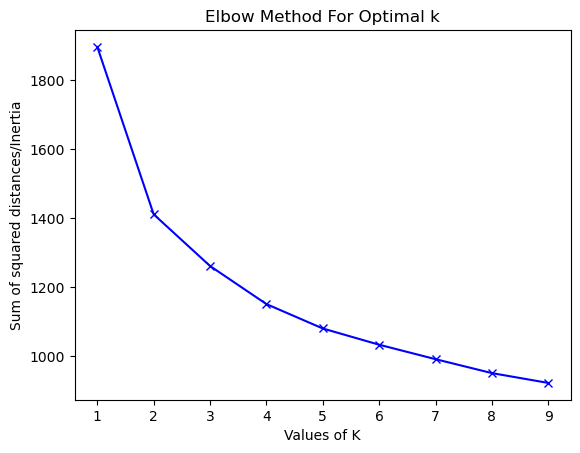

In [89]:
Sum_of_squared_distances = []
K = range(1,10)
for num_clusters in K :
 kmeans = KMeans(n_clusters=num_clusters)
 kmeans.fit(dwp)
 Sum_of_squared_distances.append(kmeans.inertia_)
    
plt.plot(K,Sum_of_squared_distances,'bx-')
plt.xlabel('Values of K') 
plt.ylabel('Sum of squared distances/Inertia') 
plt.title('Elbow Method For Optimal k')
plt.show()

In [90]:
num_cluster = 4
km = KMeans(n_clusters=4)
y_predicted = km.fit_predict(dwp )


In [91]:
dwp['cluster'] = y_predicted
dwp

,pH,EC,CO3,HCO3,Cl,SO4,NO3,TH,Ca,Mg,Na,K,F,SiO2,TDS,U(ppb),cluster
0,0.690513,0.117708,0.0,0.196774,0.097183,0.005236,0.022222,0.291667,0.172775,0.205607,0.0400,0.000000,0.086809,0.000000,0.169529,0.005430,2
1,0.657854,0.228216,0.0,0.281720,0.325897,0.026178,0.022222,0.416667,0.267016,0.271028,0.2040,0.035714,0.028936,0.000000,0.316252,0.007240,0
2,0.653188,0.089636,0.0,0.124731,0.137308,0.005236,0.000000,0.208333,0.015707,0.261682,0.0400,0.035714,0.047538,0.000000,0.123416,0.000000,2
3,0.668740,0.104205,0.0,0.170968,0.153358,0.010471,0.000000,0.225000,0.130890,0.158879,0.0600,0.071429,0.038237,0.000000,0.162822,0.000452,2
4,0.685848,0.087504,0.0,0.164516,0.137308,0.005236,0.022222,0.216667,0.130890,0.149533,0.0600,0.000000,0.058906,0.000000,0.154438,0.003846,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4613,0.724728,0.341923,0.0,0.284946,0.606773,0.026178,0.842222,0.510000,0.350785,0.308411,0.3200,0.145000,0.024286,0.264368,0.379972,0.000102,1
4614,0.752722,0.309943,0.0,0.413978,0.349972,0.068063,0.177778,0.565000,0.413613,0.317757,0.1880,0.053214,0.012401,0.264368,0.379972,0.000102,0
4615,0.712286,0.334816,0.0,0.233333,0.482385,0.418848,0.971111,0.490000,0.366492,0.261682,0.3180,0.364286,0.017568,0.264368,0.379972,0.000102,1
4616,0.684292,0.054103,0.0,0.045161,0.053046,0.109948,0.164444,0.056667,0.047120,0.018692,0.0436,0.703571,0.017568,0.264368,0.379972,0.000102,2


In [92]:
#dwp.loc[1324,'cluster']

In [93]:

lat = dtest.loc[:,['LATITUDE']].values.tolist()
long = dtest.loc[:,['LONGITUDE']].values.tolist()


In [94]:
#dwp.loc[1324,'cluster']

In [95]:
#dfinal.loc[1324,'cluster']
#dfinal.to_csv('result.csv')

In [96]:
india_center_lat = 20.5937
india_center_long = 78.9629
m_nopca = folium.Map([india_center_lat, india_center_long], zoom_start=6)
# radius=10
# folium.CircleMarker(
#     location=[lat[1][0], long[1][0]],
#     radius=radius,
#     color="blue",
#     stroke=False,
#     fill=True,
#     fill_opacity=0.6,
#     opacity=1,
       
# ).add_to(m)
# m

In [97]:
#dtest.reset_index(inplace=True)



In [98]:
radius = 5
cluster_color = ["red", "blue" , "green" , "yellow"]

def is_float(string):
    try:
        float(string)
        return True
    except ValueError:
        return False



for i in tqdm(range(0,len(lat))):
    
    lt = lat[i][0]
    lg = long[i][0]
    index = i
    a = (dtest.loc[index,['LOCATION','DISTRICT' , 'STATE']].values.tolist())
    poptext = "{loc},{dis},{state}".format(loc = a[0],dis=a[1] ,state=a[2] )
    
    if(is_float(lt) == False or is_float(lg)==False):
        continue
    cindex = dwp.loc[i,'cluster']
    
    folium.CircleMarker(
    location=[lt, lg],
    radius=radius,
    color=cluster_color[cindex],
    stroke=False,
    fill=True,
    fill_opacity=0.6,
    opacity=1,
    popup=folium.Popup(poptext)
       
).add_to(m_nopca)

    

m_nopca


100%|██████████████████████████████████████| 4618/4618 [00:05<00:00, 918.12it/s]


In [99]:
m_nopca.save(outfile= "no_pca.html")

In [100]:
silhouette_avg = silhouette_score(dwp.loc[:,features], dwp['cluster'])
silhouette_avg

0.15031891835079683

In [205]:
#num_cluster
dc1 = dwp.loc[dwp['cluster'] == 0]
dc1.describe().T.sort_values('mean', ascending=False)

,count,mean,std,min,25%,50%,75%,max
pH,1498.0,0.717925,0.062490,0.279938,0.679627,0.715397,0.757387,0.878694
TDS,1498.0,0.367871,0.143114,0.000000,0.279147,0.353981,0.429755,0.989744
TH,1498.0,0.345988,0.156111,0.000000,0.291667,0.358333,0.438333,0.902970
HCO3,1498.0,0.310116,0.098481,0.032817,0.243011,0.302151,0.367742,0.734409
Mg,1498.0,0.269369,0.124559,0.000000,0.177570,0.252336,0.336449,0.747664
SiO2,1498.0,0.262738,0.128157,0.000000,0.213116,0.264368,0.321839,1.000000
Ca,1498.0,0.233457,0.118181,0.015707,0.141361,0.225131,0.308901,0.687958
EC,1498.0,0.226340,0.061175,0.069027,0.182378,0.217556,0.263750,1.000000
Na,1498.0,0.186115,0.140093,0.000000,0.084000,0.152000,0.251000,1.000000
Cl,1498.0,0.169464,0.123956,0.000000,0.081133,0.137308,0.237621,0.992577


In [102]:
#print(dc1.index)


In [103]:
dc1.iloc[1]

pH         0.698289
EC         0.183800
CO3        0.000000
HCO3       0.347312
Cl         0.109221
SO4        0.005236
NO3        0.022222
TH         0.408333
Ca         0.193717
Mg         0.336449
Na         0.076000
K          0.000000
F          0.042371
SiO2       0.000000
TDS        0.265947
U(ppb)     0.000113
cluster    0.000000
Name: 5, dtype: float64

In [104]:
# #heatmap of cluster 0

# corrrelation_matrix =  dc1.corr()
# corrrelation_matrix
# plt.figure(figsize = (16,8))

# sn.heatmap(corrrelation_matrix, annot=True,cmap="Blues")
# plt.show()

In [209]:
#df_original

#df_original.loc[df_original['indexing'] == dc1.index.values]


#df_original.loc[df_original['indexing'] == 686]
dc1plot.describe()

,pH,EC,CO3,HCO3,Cl,SO4,NO3,TH,Ca,Mg,Na,K,F,SiO2,TDS,U(ppb)
count,1498.000000,1498.000000,1498.000000,1498.000000,1498.000000,1498.000000,1498.000000,1498.000000,1498.000000,1498.000000,1498.000000,1498.000000,1498.000000,1498.000000,1498.000000,1498.000000
mean,7.916260,654.719559,6.332788,288.408163,43.013807,23.695935,5.457119,207.592901,45.590342,28.822488,46.528832,4.705759,0.472514,22.858195,442.567072,39.861097
std,0.401809,172.162896,15.504514,91.587692,30.892314,23.291108,5.400524,93.666301,22.572607,13.327830,35.023173,4.597927,0.483408,11.149638,170.695186,91.104607
min,5.100000,212.000000,0.000000,30.520000,0.780000,0.000000,0.000000,0.000000,4.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.798571,0.000000
25%,7.670000,531.000000,0.000000,226.000000,21.000000,8.000000,0.352500,175.000000,28.000000,19.000000,21.000000,1.800000,0.200000,18.541082,336.743856,0.792207
50%,7.900000,630.000000,0.000000,281.000000,35.000000,17.000000,4.000000,215.000000,44.000000,27.000000,38.000000,3.410000,0.370000,23.000000,426.000000,2.926576
75%,8.170000,760.000000,0.000000,342.000000,60.000000,32.000000,9.045000,263.000000,60.000000,36.000000,62.750000,5.860000,0.640000,28.000000,516.377774,6.328016
max,8.950000,2832.000000,108.000000,683.000000,248.150000,177.000000,21.000000,541.782000,132.400000,80.000000,250.000000,28.000000,9.676471,87.000000,1184.289189,611.000000


In [213]:
dc4plot.describe()

,pH,EC,CO3,HCO3,Cl,SO4,NO3,TH,Ca,Mg,Na,K,F,SiO2,TDS,U(ppb)
count,695.000000,695.000000,695.000000,695.000000,695.000000,695.000000,695.000000,695.000000,695.000000,695.000000,695.000000,695.000000,695.000000,695.000000,695.000000,695.000000
mean,7.906331,1169.827482,9.694590,371.051043,140.465611,57.681727,16.065193,274.829029,59.763905,40.286665,123.870921,6.362826,0.718296,22.737159,692.303788,79.651771
std,0.445715,225.598405,25.155897,137.891254,52.758121,44.938343,11.730628,147.867562,33.666189,21.096788,52.893908,5.933938,0.713310,12.486929,195.245226,139.279270
min,6.870000,576.100000,0.000000,18.000000,14.000000,0.000000,0.000000,0.000000,2.000000,0.000000,14.000000,0.000000,0.000000,0.000000,104.658134,0.000000
25%,7.600000,1000.000000,0.000000,275.000000,99.000000,23.000000,6.000000,200.000000,34.000000,26.000000,84.000000,2.200000,0.300000,15.886138,572.500000,0.708129
50%,7.880000,1140.000000,0.000000,354.000000,140.000000,46.000000,15.000000,290.000000,56.000000,37.000000,114.000000,4.300000,0.550000,21.701493,696.834356,3.000000
75%,8.180000,1313.500000,0.000000,451.000000,178.000000,84.000000,24.000000,375.000000,81.000000,51.000000,162.000000,8.000000,0.895000,29.000000,816.000000,108.755331
max,9.070000,2090.000000,192.000000,930.000000,250.000000,191.000000,44.000000,600.000000,184.000000,107.000000,250.000000,28.000000,8.300000,74.000000,1196.521544,884.000000


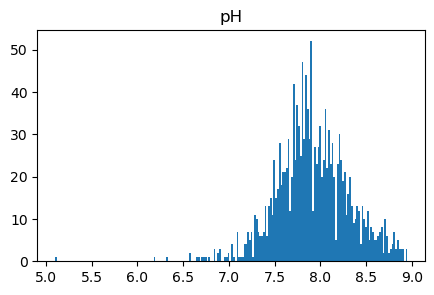

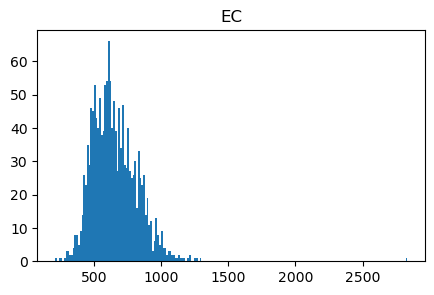

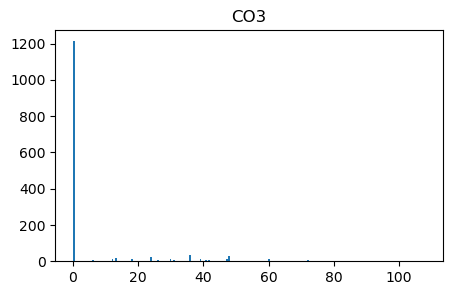

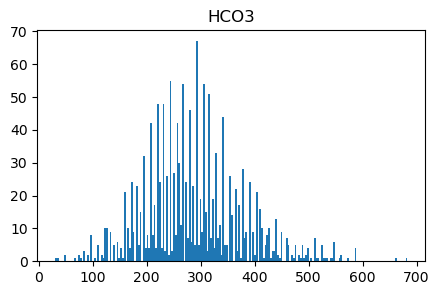

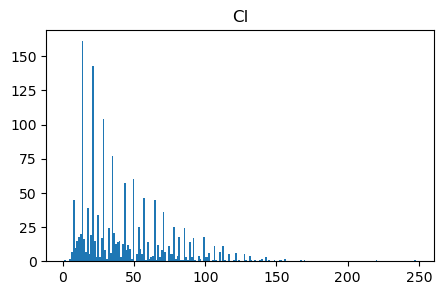

...

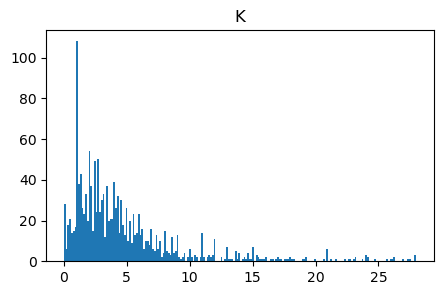

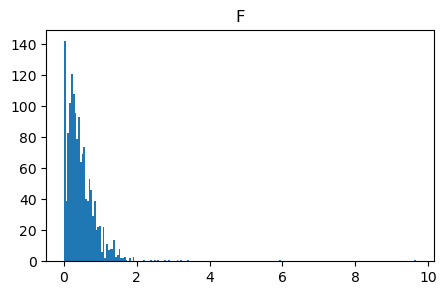

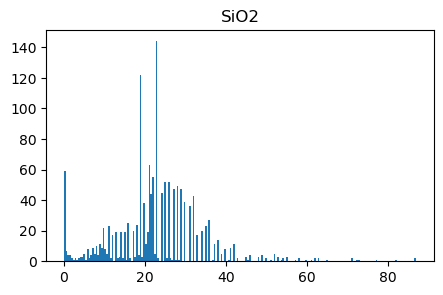

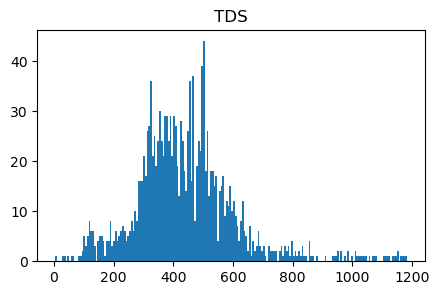

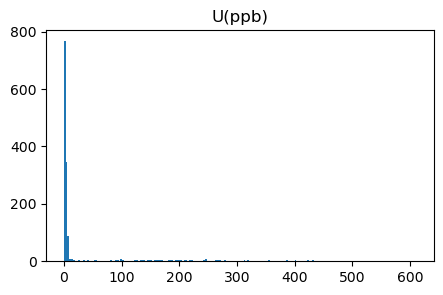

In [106]:
#dc1.hist(column='EC')
#fig, ax = plt.subplots(11, 2, sharex='col', sharey='row' , figsize=(12,7))
#ax = ax.ravel() 
#f = dc1[dc1.columns.difference(['cluster'])]
#fig.subplots_adjust(hspace=0.4, wspace=0.4)
#sn.histplot(dc1['EC'],bins=30)
dc1 = dwp.loc[dwp['cluster'] == 0]
dc1['indexing'] = dc1.index.values
mask = df_original['indexing'].isin(dc1.index.values)
dc1plot = df_original[mask]
plot_columns = dc1.loc[:, ~dc1.columns.isin(['cluster', 'indexing'])].columns

dc1plot = dc1plot.loc[:,plot_columns]
dc1plot = dc1plot.astype('float64')

index_val = 0;
for col in plot_columns:
    #print(dc1plot[col])
      
    plt.figure(figsize =(5,3))
    plt.title(col)
    plt.hist(dc1plot[col] , bins = 200)
    name = "images/cluster1/"+str(col)+".png"
    plt.savefig(name)
    plt.show()
    
   
#print(len(dc1.columns))


In [107]:


a

['Jharsuguda 2', 'JHARSUGUDA', 'Odisha']

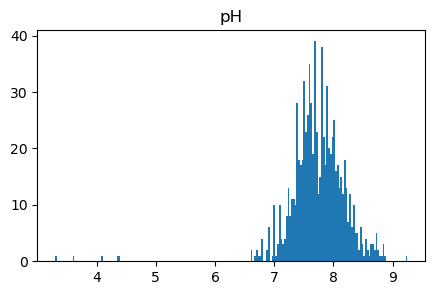

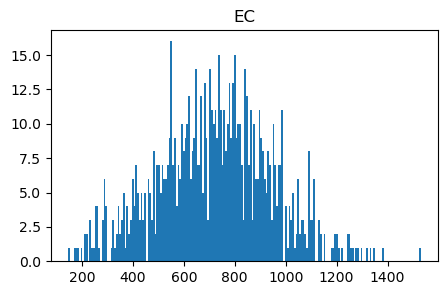

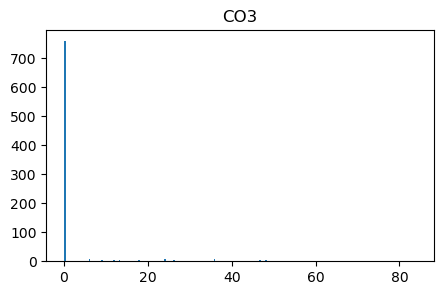

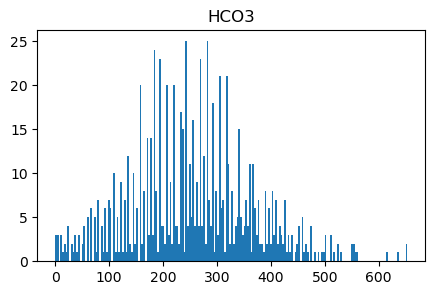

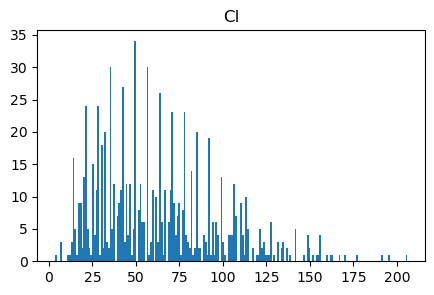

...

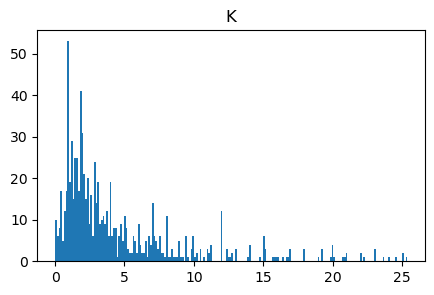

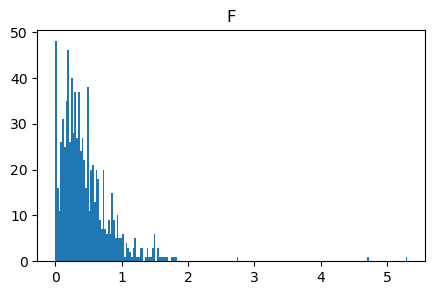

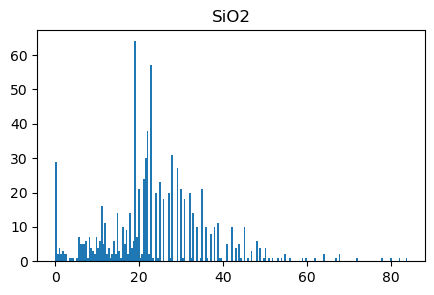

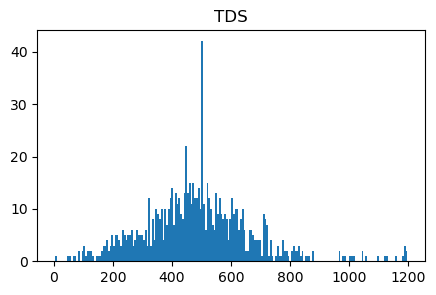

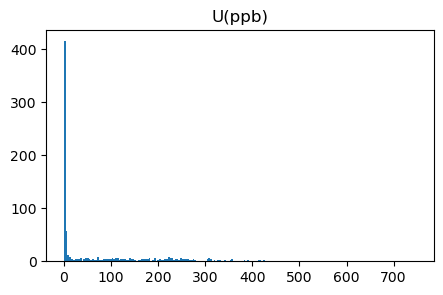

In [108]:
dc2 = dwp.loc[dwp['cluster'] == 1]
dc2.describe().T.sort_values('mean', ascending=False)
dc2['indexing'] = dc2.index.values
mask = df_original['indexing'].isin(dc2.index.values)
dc2plot = df_original[mask]
plot_columns = dc2.loc[:, ~dc2.columns.isin(['cluster', 'indexing'])].columns

dc2plot = dc2plot.loc[:,plot_columns]
dc2plot = dc2plot.astype('float64')

index_val = 0;
for col in plot_columns:
    #print(dc1plot[col])
      
    plt.figure(figsize =(5,3))
    plt.title(col)
    plt.hist(dc2plot[col] , bins = 200)
    name = "images/cluster2/"+str(col)+".png"
    plt.savefig(name)
    plt.show()
#print(len(dc1.columns))



In [109]:
#ig, axes = plt.subplots(1, 3, figsize=(15, 5), sharey=True)


In [110]:
# corrrelation_matrix =  dc2.corr()
# corrrelation_matrix
# plt.figure(figsize = (16,8))

# sn.heatmap(corrrelation_matrix, annot=True,cmap="Blues")
# plt.show()


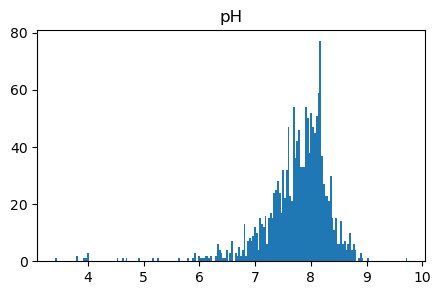

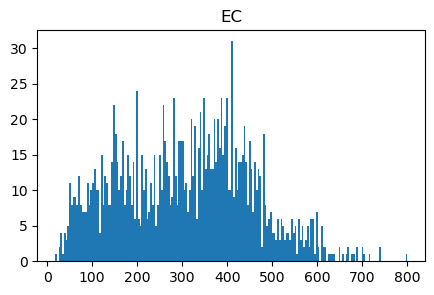

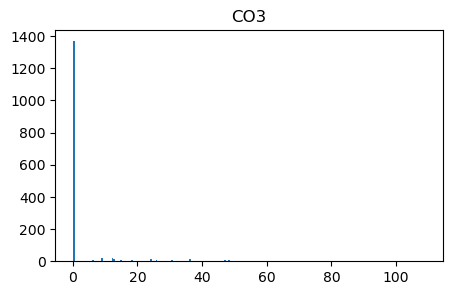

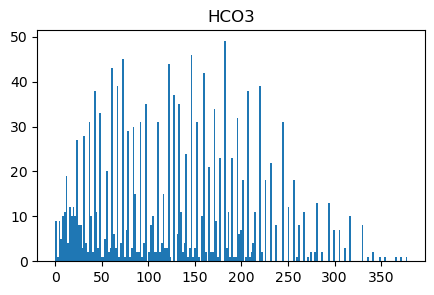

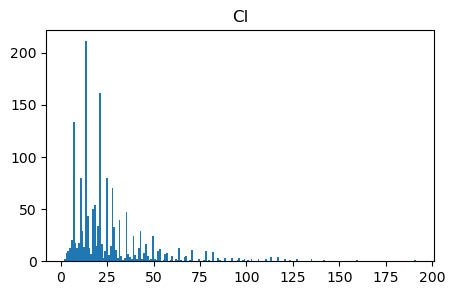

...

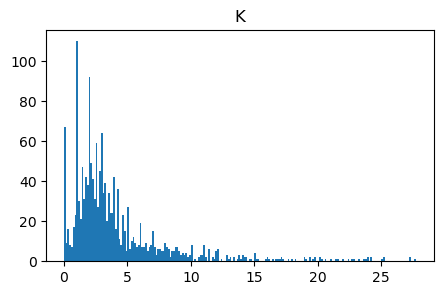

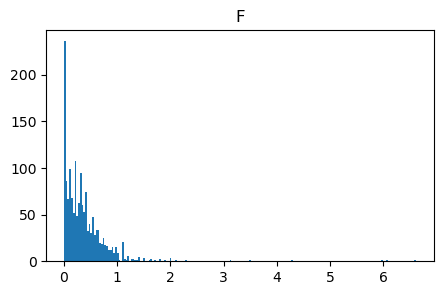

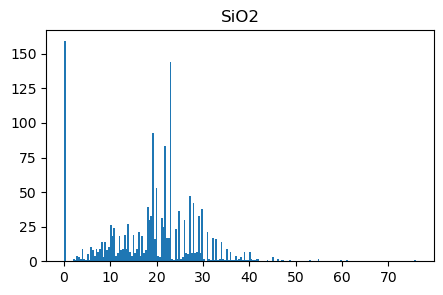

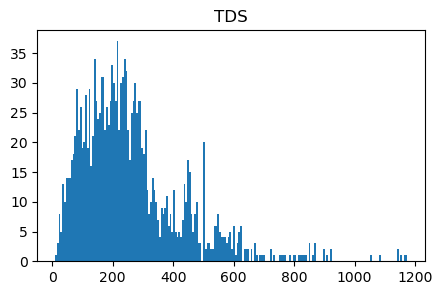

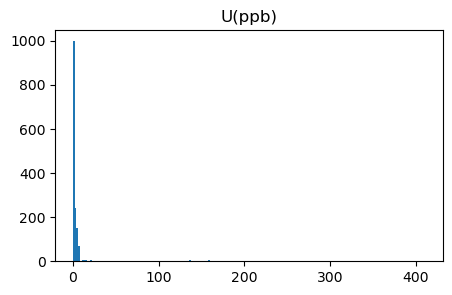

In [111]:
dc3 = dwp.loc[dwp['cluster'] == 2]
dc3['indexing'] = dc3.index.values
mask = df_original['indexing'].isin(dc3.index.values)
dc3plot = df_original[mask]
plot_columns = dc3.loc[:, ~dc3.columns.isin(['cluster', 'indexing'])].columns

dc3plot = dc3plot.loc[:,plot_columns]
dc3plot = dc3plot.astype('float64')

index_val = 0;
for col in plot_columns:
    #print(dc1plot[col])
      
    plt.figure(figsize =(5,3))
    plt.title(col)
    plt.hist(dc3plot[col] , bins = 200)
    name = "images/cluster3/"+str(col)+".png"
    plt.savefig(name)
    plt.show()
#print(len(dc1.columns))


In [112]:
# corrrelation_matrix =  dc3.corr()
# corrrelation_matrix
# plt.figure(figsize = (16,8))

# sn.heatmap(corrrelation_matrix, annot=True,cmap="Blues")
# plt.show()


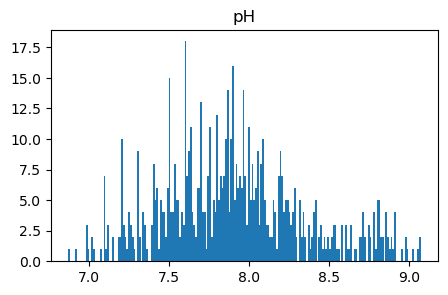

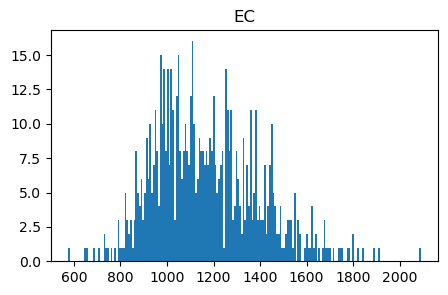

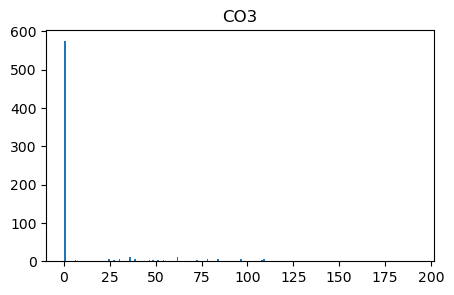

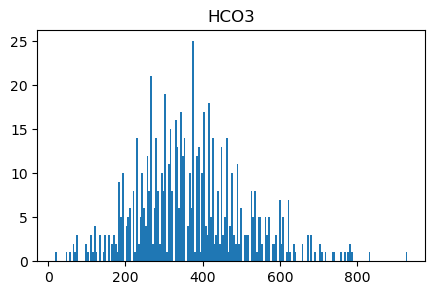

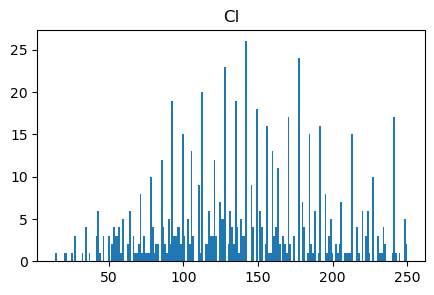

...

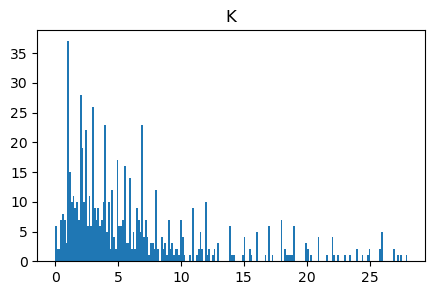

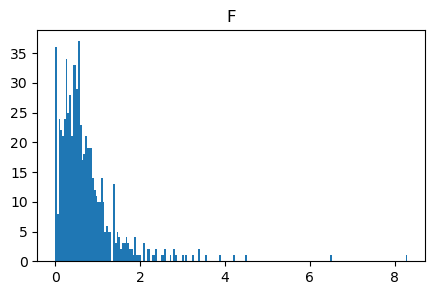

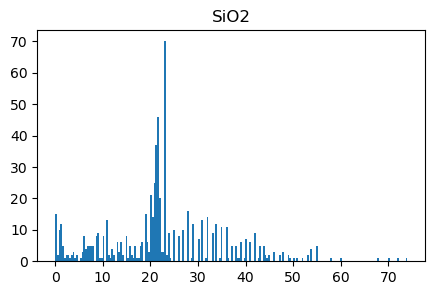

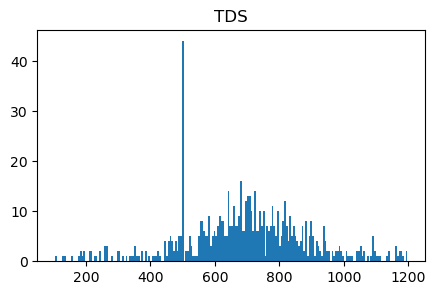

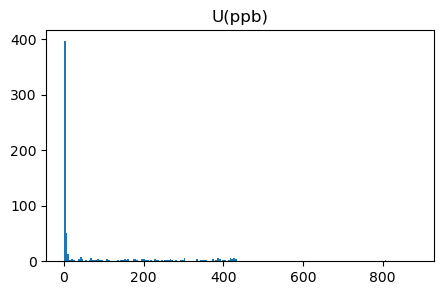

In [113]:
dc4 = dwp.loc[dwp['cluster'] == 3]
dc4['indexing'] = dc4.index.values
mask = df_original['indexing'].isin(dc4.index.values)
dc4plot = df_original[mask]
plot_columns = dc4.loc[:, ~dc4.columns.isin(['cluster', 'indexing'])].columns

dc4plot = dc4plot.loc[:,plot_columns]
dc4plot = dc4plot.astype('float64')

index_val = 0;
for col in plot_columns:
    #print(dc1plot[col])
      
    plt.figure(figsize =(5,3))
    plt.title(col)
    plt.hist(dc4plot[col] , bins = 200)
    name = "images/cluster4/"+str(col)+".png"
    plt.savefig(name)
    plt.show()
#print(len(dc1.columns))



In [114]:
## ALL PLOTs



In [115]:
# corrrelation_matrix =  dc4.corr()
# corrrelation_matrix
# plt.figure(figsize = (16,8))

# sn.heatmap(corrrelation_matrix, annot=True,cmap="Blues")
# plt.show()


## PCA

In [116]:
#pca = PCA(0.95)
pca = PCA(n_components=3)
X_pca = pca.fit_transform(X_scaled)
X_pca.shape

(4618, 3)

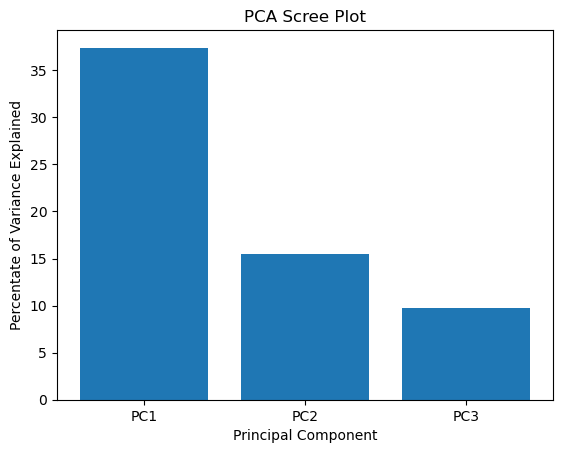

In [117]:
percent_variance = np.round(pca.explained_variance_ratio_* 100, decimals =2)
columns = ['PC1', 'PC2', 'PC3']

plt.bar(x= range(1,4), height=percent_variance, tick_label=columns)
plt.ylabel('Percentate of Variance Explained')
plt.xlabel('Principal Component')
plt.title('PCA Scree Plot')
plt.show()

In [196]:
pca.explained_variance_ratio_ 

array([0.37401882, 0.15461862, 0.09739425])

Text(0, 0.5, 'cumulative explained variance')

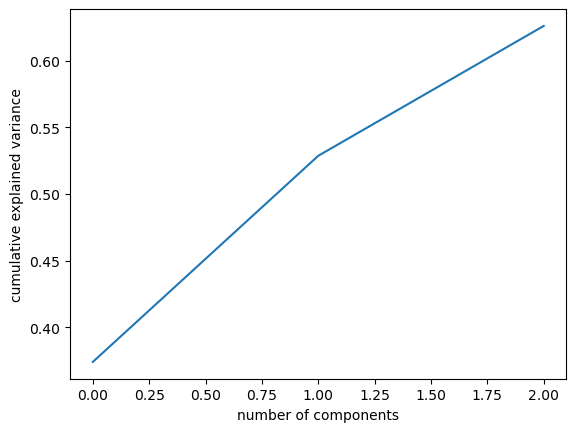

In [119]:
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')

In [191]:

components = pd.DataFrame(pca.components_.T, columns=['PC1', 'PC2' , 'PC3'], index=features)
components


,PC1,PC2,PC3
pH,0.008042,-0.089699,0.008838
EC,0.280923,-0.131501,0.018993
CO3,0.014060,-0.069880,0.066370
HCO3,0.245164,-0.197226,-0.179011
Cl,0.390835,-0.149998,0.333872
SO4,0.205854,-0.093962,0.180411
NO3,0.429663,0.870595,0.106945
TH,0.368747,-0.090356,-0.629431
Ca,0.219985,0.033906,-0.308837
Mg,0.241310,-0.206247,-0.148757


In [121]:
dfinal = pd.DataFrame(X_pca, columns=['PC1', 'PC2' , 'PC3'])
dfinal


,PC1,PC2,PC3
0,-0.380833,-0.076081,-0.151938
1,-0.048914,-0.225645,-0.119414
2,-0.467440,-0.083534,-0.029467
3,-0.415594,-0.088319,-0.043144
4,-0.431804,-0.056080,-0.057416
...,...,...,...
4613,0.589797,0.366512,0.020887
4614,0.223125,-0.167948,-0.291556
4615,0.661764,0.471501,0.143995
4616,-0.393969,0.062241,0.259287


array([0.15371155, 0.06354404, 0.04002639])

In [190]:
features

['pH',
 'EC',
 'CO3',
 'HCO3',
 'Cl',
 'SO4',
 'NO3',
 'TH',
 'Ca',
 'Mg',
 'Na',
 'K',
 'F',
 'SiO2',
 'TDS',
 'U(ppb)']

In [122]:
dcor = pd.DataFrame(pca.components_.T, columns =['X', 'Y', 'Z'])
dcor

,X,Y,Z
0,0.008042,-0.089699,0.008838
1,0.280923,-0.131501,0.018993
2,0.014060,-0.069880,0.066370
3,0.245164,-0.197226,-0.179011
4,0.390835,-0.149998,0.333872
5,0.205854,-0.093962,0.180411
6,0.429663,0.870595,0.106945
7,0.368747,-0.090356,-0.629431
8,0.219985,0.033906,-0.308837
9,0.241310,-0.206247,-0.148757


In [123]:
# fig = plt.figure()

# # syntax for 3-D plotting
# plt.figure(figsize=(10,10))
# ax = plt.axes(projection='3d')
# # colors=[]
# # for i in range(0,len(features)):
# #     colors.append(list(np.random.choice(range(256), size=3)))
# # colors

# rgb = np.random.random((17, 3))

# #colors = list(np.random.choice(range(256), size=3))
# X=dcor['X'].values.tolist()
# Y=dcor['Y'].values.tolist()
# Z=dcor['Z'].values.tolist()

# # syntax for plotting
# #ax.plot_surface(x, y, z, cmap='viridis',\
# #               edgecolor='green')
# #ax.legend(features, title="Legend")
# i=0
# for x, y, z in zip( X, Y, Z):
#     label = features[i]
#     i=i+1
#     ax.text(x, y, z, label,size=10)

# ax.scatter3D(X, Y, Z, color = rgb,s=50)


# plt.show()


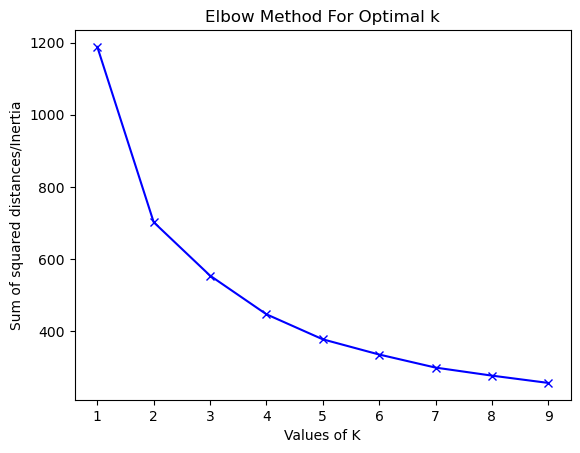

In [124]:
Sum_of_squared_distances = []
K = range(1,10)
for num_clusters in K :
 kmeans = KMeans(n_clusters=num_clusters)
 kmeans.fit(dfinal)
 Sum_of_squared_distances.append(kmeans.inertia_)
    
plt.plot(K,Sum_of_squared_distances,'bx-')
plt.xlabel('Values of K') 
plt.ylabel('Sum of squared distances/Inertia') 
plt.title('Elbow Method For Optimal k')
plt.show()

In [125]:
km = KMeans(n_clusters=4)
y_predicted = km.fit_predict(dfinal )


In [126]:
dfinal['cluster'] = y_predicted

In [127]:
#dfinal.loc[1324,'cluster']

Starting


100%|██████████████████████████████████████| 4618/4618 [00:21<00:00, 218.39it/s]


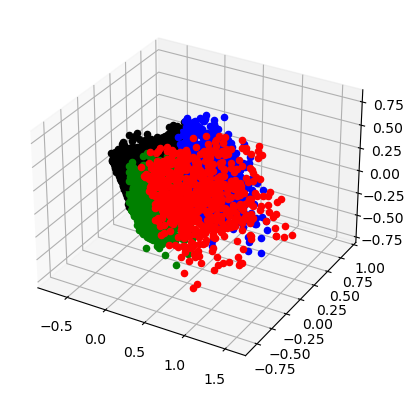

In [128]:
fig = plt.figure()

# syntax for 3-D plotting
#dfinal
ax = plt.axes(projection='3d')

colors = ["red" , "green" , "blue" , "black"]
X=dfinal['PC1'].values.tolist()
Y=dfinal['PC2'].values.tolist()
Z=dfinal['PC3'].values.tolist()

print("Starting")
for i in tqdm(range(0,len(X))):
    #print(i ,"/" , len(X))
    location = dfinal.iloc[i,3]
    ax.scatter3D(X[i], Y[i] ,Z[i] ,color=colors[location])

plt.show()

In [129]:

#cluster = df.loc[:,['longitude']].values.tolist()


In [130]:
india_center_lat = 20.5937
india_center_long = 78.9629
m = folium.Map([india_center_lat, india_center_long], zoom_start=6)
# radius=10
# folium.CircleMarker(
#     location=[lat[1][0], long[1][0]],
#     radius=radius,
#     color="blue",
#     stroke=False,
#     fill=True,
#     fill_opacity=0.6,
#     opacity=1,
       
# ).add_to(m)
# m

In [131]:
#a=dfinal.loc[0,'cluster']



In [132]:
radius = 5
cluster_color = ["red", "blue" , "green" , "yellow"]

def is_float(string):
    try:
        float(string)
        return True
    except ValueError:
        return False



for i in tqdm(range(0,len(lat))):
    
    lt = lat[i][0]
    lg = long[i][0]
    index = i
    a = (dtest.loc[index,['LOCATION','DISTRICT' , 'STATE']].values.tolist())
    poptext = "{loc},{dis},{state}".format(loc = a[0],dis=a[1] ,state=a[2] )

    

    if(is_float(lt) == False or is_float(lg)==False):
        continue
    cindex = dfinal.loc[i,'cluster']
    
    folium.CircleMarker(
    location=[lt, lg],
    radius=radius,
    color=cluster_color[cindex],
    stroke=False,
    fill=True,
    fill_opacity=0.6,
    opacity=1,
    popup=folium.Popup(poptext)
       
).add_to(m)

    

m


100%|█████████████████████████████████████| 4618/4618 [00:04<00:00, 1057.73it/s]


In [133]:
m.save(outfile= "pcamap.html")

In [134]:
silhouette_avg = silhouette_score(dfinal.loc[:,['PC1','PC2','PC3']], dfinal['cluster'])
silhouette_avg

0.29514882034929973

In [135]:
pv = ['PC1' , 'PC2' , 'PC3']
dc1 = dfinal.loc[dfinal['cluster'] == 0]
dc1 = dc1.loc[:,pv]
dc1.describe().T.sort_values('mean', ascending=False)


,count,mean,std,min,25%,50%,75%,max
PC1,680.0,0.598871,0.272880,0.127439,0.395194,0.542568,0.767181,1.579389
PC3,680.0,0.136388,0.267337,-0.705083,-0.052477,0.140523,0.337123,0.771474
PC2,680.0,-0.194935,0.230652,-0.813824,-0.380021,-0.186907,-0.005779,0.319400


In [136]:
dc2 = dfinal.loc[dfinal['cluster'] == 1]
dc2 = dc2.loc[:,pv]
dc2.describe().T.sort_values('mean', ascending=False)


,count,mean,std,min,25%,50%,75%,max
PC1,1462.0,-0.019271,0.151986,-0.306260,-0.138661,-0.033292,0.086661,0.451661
PC3,1462.0,-0.100229,0.180823,-0.545442,-0.228148,-0.120295,0.015820,0.509464
PC2,1462.0,-0.144502,0.132238,-0.472945,-0.234180,-0.158909,-0.054161,0.260690


In [137]:
dc3 = dfinal.loc[dfinal['cluster'] == 2]
dc3 = dc3.loc[:,pv]
dc3.describe().T.sort_values('mean', ascending=False)


,count,mean,std,min,25%,50%,75%,max
PC2,826.0,0.363595,0.163986,0.012179,0.242816,0.350214,0.479734,0.916185
PC1,826.0,0.288339,0.249080,-0.262656,0.105044,0.275467,0.444098,1.067531
PC3,826.0,-0.015758,0.202568,-0.679304,-0.152169,-0.019622,0.122242,0.575103


In [138]:
dc4 = dfinal.loc[dfinal['cluster'] == 3]
dc4 = dc4.loc[:,pv]
dc4.describe().T.sort_values('mean', ascending=False)


,count,mean,std,min,25%,50%,75%,max
PC3,1650.0,0.040489,0.121654,-0.277998,-0.044787,0.046040,0.113695,0.601308
PC2,1650.0,0.026357,0.161132,-0.309911,-0.092859,-0.008922,0.107495,0.717045
PC1,1650.0,-0.374076,0.135347,-0.721193,-0.467729,-0.362014,-0.277380,-0.047336


## Gmm

In [139]:
# dop = pd.DataFrame(X_scaled, columns=features) 
# clustering = OPTICS(min_samples=2).fit(dop)

# y_predicted = clustering.labels_

In [140]:
# y_predicted

In [141]:
# print(np.unique(y_predicted))

# dop['cluster'] = y_predicted
# dop

## pca

In [142]:
# dop_pca = pd.DataFrame(X_pca, columns=['PC1', 'PC2' , 'PC3'])
# dop_pca

# clustering = OPTICS(min_samples=2 ,xi=0.5).fit(dop_pca)

# y_predicted = clustering.labels_

In [143]:
# dop_pca['cluster'] = y_predicted

In [144]:
# np.unique(y_predicted)
# y_predicted[:900]

In [145]:
# fig = plt.figure()

# # syntax for 3-D plotting
# #dfinal
# ax = plt.axes(projection='3d')

# colors = ["violet" ,"red" , "green" , "blue" , "black" , "yellow"]
# X=dop_pca['PC1'].values.tolist()
# Y=dop_pca['PC2'].values.tolist()
# Z=dop_pca['PC3'].values.tolist()

# print("Starting")
# for i in tqdm(range(0,len(X))):
#     #print(i ,"/" , len(X))
#     location = dop_pca.iloc[i,3]
#     #ax.scatter3D(X[i], Y[i] ,Z[i] ,color=colors[location])
#     ax.scatter3D(X[i], Y[i] ,Z[i] )

# plt.show()

In [146]:
# india_center_lat = 20.5937
# india_center_long = 78.9629
# m2 = folium.Map([india_center_lat, india_center_long], zoom_start=6)

In [147]:
# radius = 5
# cluster_color = ["purple","red", "blue" , "green" , "yellow"]

# def is_float(string):
#     try:
#         float(string)
#         return True
#     except ValueError:
#         return False



# for i in tqdm(range(0,len(lat))):
    
#     lt = lat[i][0]
#     lg = long[i][0]
#     index = i
#     a = (dtest.loc[index,['LOCATION','DISTRICT' , 'STATE']].values.tolist())
#     poptext = "{loc},{dis},{state}".format(loc = a[0],dis=a[1] ,state=a[2] )

    

#     if(is_float(lt) == False or is_float(lg)==False):
#         continue
#     cindex = dop_pca.loc[i,'cluster'] + 1
    
    
#     folium.CircleMarker(
#     location=[lt, lg],
#     radius=radius,
#     color=cluster_color[cindex],
#     stroke=False,
#     fill=True,
#     fill_opacity=0.6,
#     opacity=1,
#     popup=folium.Popup(poptext)
       
# ).add_to(m2)

    

# m2


In [ ]:
# dop_pca = pd.DataFrame(X_pca, columns=['PC1', 'PC2' , 'PC3'])
# dop_pca

# gmm = GaussianMixture(n_components=4)
# gmm.fit(dop_pca)
# y_predicted = gmm.predict(data)

# dop_pca['cluster'] = y_predicted

In [183]:
import skfuzzy as fuzz
from skfuzzy import control as ctrl

dop_pca = pd.DataFrame(X_pca, columns=['PC1', 'PC2' , 'PC3'])
dop_pca
X = dop_pca.values

n_clusters = 4
cntr, u, u0, d, jm, p, fpc = fuzz.cluster.cmeans(
    X.T , n_clusters, 2, error=0.005, maxiter=1000, init=None
)
cluster_membership = np.argmax(u, axis=0)

In [184]:
dop_pca['cluster'] = cluster_membership

In [185]:
silhouette_avg = silhouette_score(dop_pca.loc[:,['PC1','PC2','PC3']], dop_pca['cluster'])
silhouette_avg

0.28473910490285864

Starting


100%|██████████████████████████████████████| 4618/4618 [00:20<00:00, 221.57it/s]


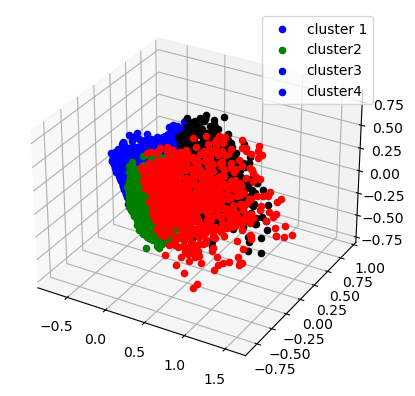

In [198]:
fig = plt.figure()

# syntax for 3-D plotting
#dfinal
ax = plt.axes(projection='3d')

colors = ["red" , "green" , "blue" , "black"]
X=dop_pca['PC1'].values.tolist()
Y=dop_pca['PC2'].values.tolist()
Z=dop_pca['PC3'].values.tolist()

print("Starting")
for i in tqdm(range(0,len(X))):
    #print(i ,"/" , len(X))
    location = dop_pca.iloc[i,3]
    ax.scatter3D(X[i], Y[i] ,Z[i] ,color=colors[location])

name = "images/fuzzy.png"
plt.legend(['cluster 1' , 'cluster2' , 'cluster3' , 'cluster4']) 
plt.savefig(name)

plt.show()